In [1]:
#imports
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pickle


%matplotlib inline
sns.set()

In [2]:
from sklearn.linear_model import Lasso, Ridge, ElasticNet, LinearRegression

from sklearn.model_selection import (cross_val_score, train_test_split, 
                                     KFold, GridSearchCV)

In [3]:
with open('clean_players.pkl', 'rb') as picklefile:
    C = pickle.load(picklefile)    

In [4]:
C.head()

,Name,Height,Weight,Draft Position,Career Earnings,Current Season(C),C_Experience,C_Age,C_Tm,C_Lg,...,Current Season(C)_2017-18,C_Pos_C,C_Pos_PF,C_Pos_PF-C,C_Pos_PG,C_Pos_PG-SG,C_Pos_SF,C_Pos_SF-SG,C_Pos_SG,C_Pos_SG-SF
4,Fred VanVleet,72,195,61,543471,2016-17,1,22,TOR,NBA,...,0,0,0,0,1,0,0,0,0,0
8,Tony Bradley,83,240,28,0,2017-18,1,20,UTA,NBA,...,1,1,0,0,0,0,0,0,0,0
26,Luke Kennard,78,206,12,0,2017-18,1,21,DET,NBA,...,1,0,0,0,0,0,0,0,1,0
29,Cameron Payne,75,185,14,4134000,2015-16,1,21,OKC,NBA,...,0,0,0,0,1,0,0,0,0,0
33,Ivan Rabb,82,220,35,0,2017-18,1,20,MEM,NBA,...,1,0,1,0,0,0,0,0,0,0


In [5]:
#Categorical but does have order to it, don't actually need the dummies
C['Current Season(C)'] = C['Current Season(C)'].replace({'2016-17':2017, '2015-16':2016, '2017-18':2018})

In [6]:
C.drop(['Current Season(C)_2017-18','Current Season(C)_2016-17','Current Season(C)_2015-16'], axis=1, inplace=True)

In [7]:
C.shape

(1203, 164)

In [8]:
# Drop down to likely columns

In [21]:
reduced = C[['Draft Position', 'Weight', 'Height', 'C_Age', 'Current Season(C)', 'C_Experience', 'C_MP', 'P_TRB', 'C_PTS', 'P_AST', 'P_PER', 'C_Salary', 'P_PTS', 'P_MP', 'P_BPM', 'P_VORP']]

In [22]:
reduced.count()

Draft Position       1203
Weight               1203
Height               1203
C_Age                1203
Current Season(C)    1203
C_Experience         1203
C_MP                 1203
P_TRB                1017
C_PTS                1203
P_AST                1017
P_PER                1017
C_Salary             1203
P_PTS                1017
P_MP                 1017
P_BPM                1017
P_VORP               1017
dtype: int64

In [23]:
# drop rookies - they are getting paid based on production last year
reduced.dropna(inplace=True)

/home/douglas/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [24]:
reduced.shape

(1017, 16)

In [25]:
reduced.describe()

,Draft Position,Weight,Height,C_Age,Current Season(C),C_Experience,C_MP,P_TRB,C_PTS,P_AST,P_PER,C_Salary,P_PTS,P_MP,P_BPM,P_VORP
count,1017.000000,1017.000000,1017.000000,1017.000000,1017.000000,1017.000000,1017.000000,1017.000000,1017.000000,1017.000000,1017.000000,1.017000e+03,1017.000000,1017.000000,1017.000000,1017.000000
mean,26.635202,220.524090,79.009833,27.278269,2017.008850,6.659784,1350.636185,3.868338,9.259587,2.013668,14.012684,6.324775e+06,9.319862,1412.180924,-0.948083,0.737758
std,19.836479,26.105586,3.442712,4.266959,0.821057,4.141005,815.330821,2.385158,6.015722,1.806740,6.254803,6.571080e+06,5.768223,782.093477,3.390880,1.444229
min,1.000000,150.000000,69.000000,20.000000,2016.000000,2.000000,10.000000,0.000000,0.000000,0.000000,-11.400000,5.145000e+03,0.000000,1.000000,-20.100000,-1.400000
25%,9.000000,200.000000,76.000000,24.000000,2016.000000,3.000000,643.000000,2.200000,4.900000,0.800000,10.800000,1.499187e+06,5.200000,786.000000,-2.700000,-0.100000
50%,22.000000,220.000000,79.000000,27.000000,2017.000000,6.000000,1391.000000,3.300000,7.800000,1.400000,13.600000,3.700000e+06,8.000000,1432.000000,-1.000000,0.300000
75%,41.000000,240.000000,82.000000,30.000000,2018.000000,9.000000,2018.000000,5.000000,12.600000,2.600000,16.600000,9.250000e+06,12.400000,2052.000000,0.800000,1.100000
max,61.000000,307.000000,87.000000,41.000000,2018.000000,21.000000,3125.000000,14.800000,31.600000,11.700000,129.100000,3.468255e+07,31.600000,3125.000000,24.800000,12.400000


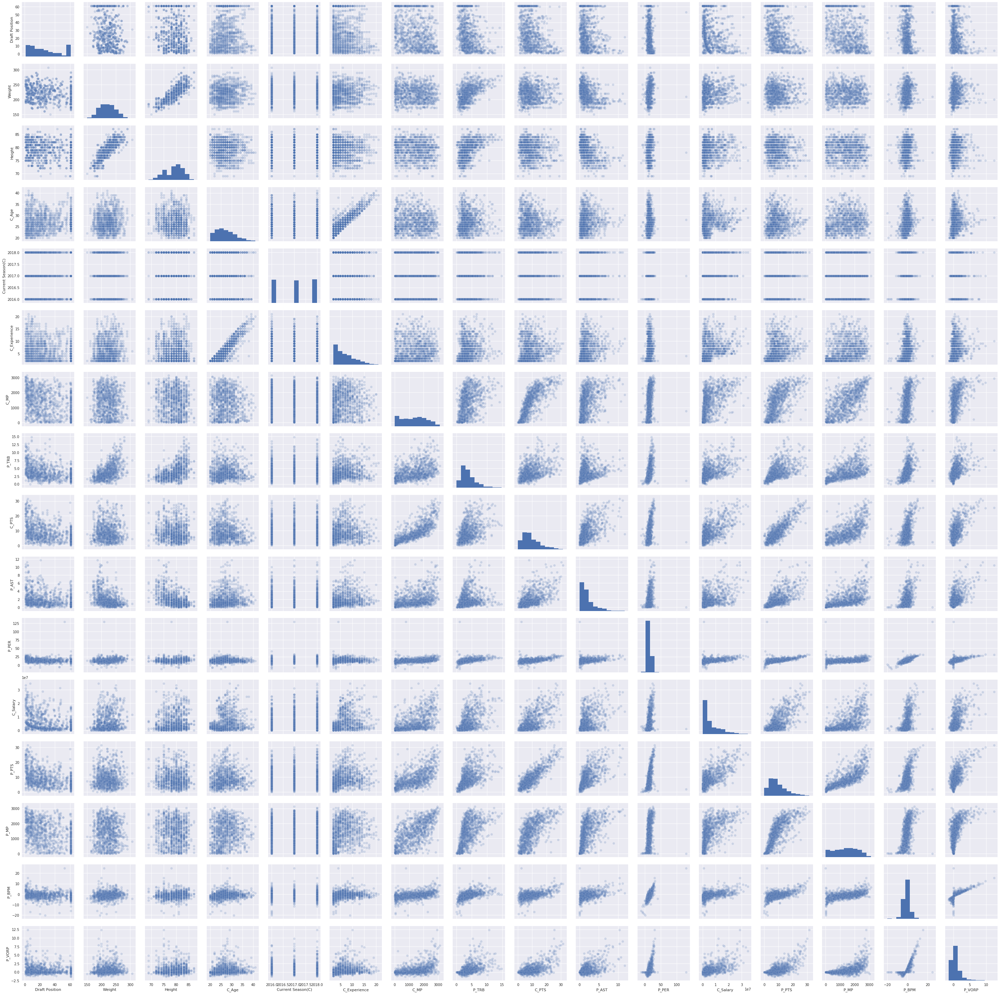

In [26]:
sns.pairplot(reduced, plot_kws={'alpha':0.2})

In [27]:
#hold out 10%
X_all = reduced.drop(['C_Salary'], axis=1)
y_all = reduced['C_Salary']
X, X_test, y, y_test = train_test_split(X_all, y_all, test_size=0.1, random_state=42)

In [28]:
kfold = KFold(n_splits=5, shuffle=True, random_state=0)

In [35]:
def regress(features, target):
    kfold = KFold(n_splits=5, shuffle=True, random_state=0)
    lm = LinearRegression()
    lm_scores = cross_val_score(lm, features, target, # estimator, features, target
                cv=kfold, # number of folds 
                scoring='r2') # scoring metric
    print(lm_scores)
    print("Linear Reg Mean Score: ", np.mean(lm_scores))
    lm.fit(features, target)
    return lm.predict(features)

def plots(actual, predicted, modelnumber, islo=True):
    plt.figure(figsize=[14,8])
    plt.subplot(1, 2, 1)
    plt.scatter(actual, predicted, alpha=0.2)
    plt.plot([0, 35000000], [0, 35000000])
    #if islo:
     #   plt.plot([0, 5000000], [0, 5000000])
    #if not islo:
    #    plt.plot([5000000, 35000000], [5000000, 35000000])
    plt.title('Model %s Predicted vs actual' % modelnumber)
    plt.ylabel('Predicted Salary')
    
    plt.subplot(1, 2, 2)
    plt.scatter(actual, actual - predicted, alpha=0.2)
    plt.axhline()
    plt.title('Model %s Residuals' % modelnumber)
    plt.ylabel('Residuals')

[0.5253307  0.52670313 0.44326596 0.47990267 0.38613589]
Linear Reg Mean Score:  0.4722676706649184


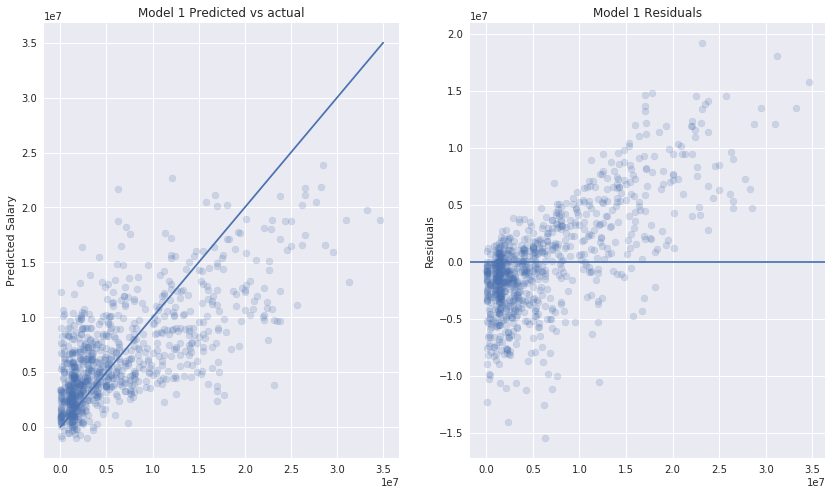

In [36]:
one_var = regress(X['P_PTS'].values.reshape(-1,1), y)
plots(y, one_var, 1)

In [43]:
def RMSE(actual, predicted):
    return np.sqrt(np.mean((actual - predicted)**2))

def MAD(actual, predicted):
    return np.mean(abs(actual - predicted))

print('Model 1 RMSE=', RMSE(y, one_var))
print('Model 1 MAD=', MAD(y, one_var))

Model 1 RMSE= 4693188.915201886
Model 1 MAD= 3463976.611432522


[0.57165898 0.56197216 0.51249102 0.5260677  0.41034871]
Linear Reg Mean Score:  0.5165077152967275


/home/douglas/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:106: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


Text(0.5,0,'Actual Salary')

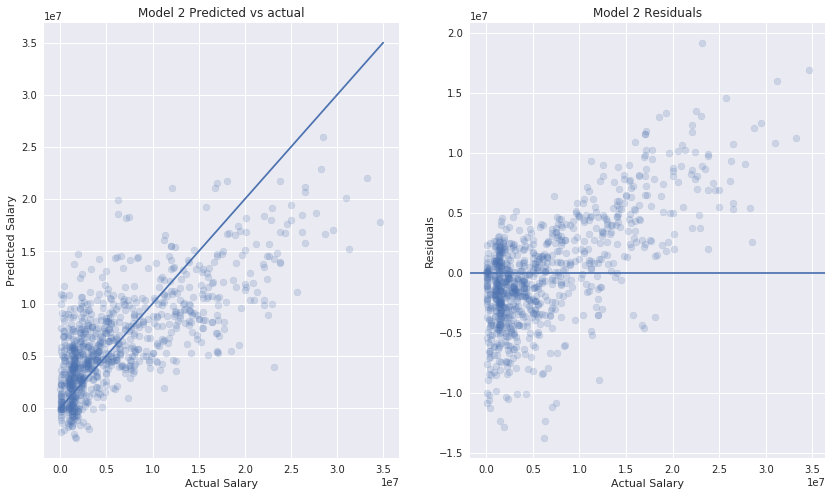

In [76]:
multi_var = regress(X[['P_PTS', 'P_AST', 'P_TRB','C_Age']], y)
plots(y, multi_var, 2)
plt.xlabel('Actual Salary')
plt.subplot(1, 2, 1)
plt.xlabel('Actual Salary')

In [73]:
multi_lr = LinearRegression()
multi_lr.fit(X[['P_PTS', 'P_AST', 'P_TRB','C_Age']], y)
list(zip(['P_PTS', 'P_AST', 'P_TRB','C_Age'], multi_lr.coef_))

[('P_PTS', 615570.2694617868),
 ('P_AST', 190701.5202257539),
 ('P_TRB', 574391.3140556514),
 ('C_Age', 202737.11872930411)]

In [45]:
print('Model 2 RMSE=', RMSE(y, multi_var))
print('Model 2 MAD=', MAD(y, multi_var))

Model 2 RMSE= 4478609.881738035
Model 2 MAD= 3373753.821622141


In [77]:
## Test on holdout set
ypred = multi_lr.predict(X_test[['P_PTS', 'P_AST', 'P_TRB','C_Age']])


In [81]:
X_test[['P_PTS', 'P_AST', 'P_TRB','C_Age']].corr()

,P_PTS,P_AST,P_TRB,C_Age
P_PTS,1.000000,0.545666,0.597787,-0.009837
P_AST,0.545666,1.000000,0.186906,0.108916
P_TRB,0.597787,0.186906,1.000000,0.078811
C_Age,-0.009837,0.108916,0.078811,1.000000


In [78]:
regress(X_test, y_test)

[ 0.69463272 -0.08373916  0.43978385  0.56552852  0.2627606 ]
Linear Reg Mean Score:  0.3757933067252878


array([18578099.24992228,  1704634.53827333,  6441308.15833712,
       17029297.18415451,  1850576.82036304, 15492356.76217127,
       -2189982.433002  ,  7096425.79750252,  2401206.38806295,
        5640927.72620916,  1281467.33973551, 11844443.78474951,
       10876974.5915451 ,   470705.53956175, 16777164.49422264,
       12008878.50790787, 10286375.63719797,   438726.77032948,
       13198020.93494511,  -450688.4636035 ,  7034930.60905266,
        7580040.12263536,  5666365.31686687,  1534011.58841801,
       15510752.36854219, 13607206.9299655 ,  5833409.97618341,
        8933132.05206966,  9066748.28559446,  5426317.07913685,
         265554.72810888,  -376751.62915611,  4697429.1496439 ,
        5266604.47702646,  2538707.69271564,  6579459.683743  ,
        6504294.4776516 ,  3095487.85703421,  4634176.87397575,
       13420577.42439556,  -173933.53306484,  4209416.85859156,
        -333612.25632191,  1973917.0252099 ,  5886624.98522997,
        5235191.71860123,  5901884.74220

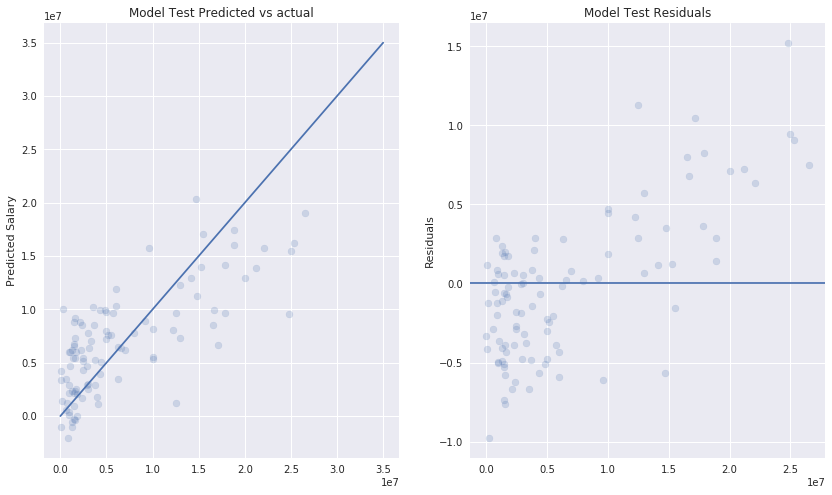

In [79]:
plots(y_test, ypred, 'Test')

In [80]:
print('Model 2 RMSE=', RMSE(y_test, ypred))
print('Model 2 MAD=', MAD(y_test, ypred))

Model 2 RMSE= 4620787.344314092
Model 2 MAD= 3602943.504109579


## LR Model 1: Basic Linear Model

In [46]:
import statsmodels.api as sm
model = sm.OLS(y,sm.add_constant(X)) #add_costant() adds the b of an mx+b
results = model.fit()

results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               C_Salary   R-squared:                       0.586
Model:                            OLS   Adj. R-squared:                  0.579
Method:                 Least Squares   F-statistic:                     84.72
Date:                Fri, 20 Jul 2018   Prob (F-statistic):          3.00e-160
Time:                        02:37:41   Log-Likelihood:                -15253.
No. Observations:                 915   AIC:                         3.054e+04
Df Residuals:                     899   BIC:                         3.062e+04
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const              -2.37e+09   3.48e+08     -6.808      0.000   -3.05e+09   -1.69e+09
Draft Position    -1.048e+04   9606.356     -1.091      0.276   -2.93e+04    8373.941
Weight             1.014e+04   1.03e+04      0.982      0.326   -1.01e+04    3.04e+04
Height             1.841e+05   8.37e+04      2.198      0.028    1.97e+04    3.48e+05
C_Age              1.221e+05   9.24e+04      1.322      0.187   -5.92e+04    3.03e+05
Current Season(C)  1.164e+06   1.73e+05      6.745      0.000    8.25e+05     1.5e+06
C_Experience       1.545e+05   9.69e+04      1.595      0.111   -3.56e+04    3.45e+05
C_MP                856.8388    315.878      2.713      0.007     236.895    1476.783
P_TRB              1.935e+05   1.05e+05      1.844      0.065   -1.24e+04    3.99e+05
C_PTS              1.005e+05    6.3e+04      1.597      0.111    -2.3e+04    2.24e+05
P_AST               2.84e+05    1.3e+05      2.188      0.029    2.93e+04    5.39e+05
P_PER             -3617.4854   3.97e+04     -0.091      0.927   -8.15e+04    7.43e+04
P_PTS               3.92e+05   6.79e+04      5.773      0.000    2.59e+05    5.25e+05
P_MP                -44.8255    341.581     -0.131      0.896    -715.214     625.563
P_BPM             -1.387e+05    9.5e+04     -1.461      0.144   -3.25e+05    4.77e+04
P_VORP             8.551e+05   1.93e+05      4.430      0.000    4.76e+05    1.23e+06
==============================================================================
Omnibus:                       43.074   Durbin-Watson:                   2.103
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               73.820
Skew:                           0.355   Prob(JB):                     9.33e-17
Kurtosis:                       4.197   Cond. No.                     7.22e+06
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 7.22e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

[0.59196509 0.63756133 0.51401727 0.59516138 0.46118121]
Linear Reg Mean Score:  0.5599772551883361
Model 2 RMSE= 4201743.653642359
Model 2 MAD= 3133996.0225071358


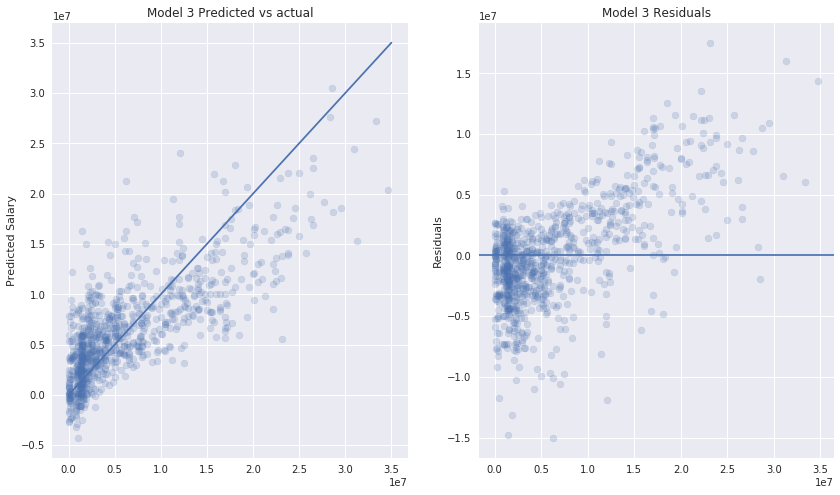

In [49]:
all_var = regress(X, y)
plots(y, all_var, 3)
print('Model 2 RMSE=', RMSE(y, all_var))
print('Model 2 MAD=', MAD(y, all_var))

In [50]:
all_var_lr = LinearRegression()
all_var_lr.fit(X,y)
list(zip(X.columns, all_var_lr.coef_))

[('Draft Position', -10479.552620953778),
 ('Weight', 10138.835468390665),
 ('Height', 184080.42588742077),
 ('C_Age', 122116.02817944634),
 ('Current Season(C)', 1163756.0339545072),
 ('C_Experience', 154457.74371317078),
 ('C_MP', 856.8388337754004),
 ('P_TRB', 193490.9853887427),
 ('C_PTS', 100542.62274005127),
 ('P_AST', 283991.3913369285),
 ('P_PER', -3617.485381496954),
 ('P_PTS', 392045.70265540836),
 ('P_MP', -44.82554794207681),
 ('P_BPM', -138695.45844961324),
 ('P_VORP', 855099.4584843093)]

In [ ]:
#interpretable?
#still underpredicting

In [51]:
#add cubic 
def add_cubic_cols(df, listcols):
    df2 = df.copy()
    for col in listcols:
        df2['square_%s' % col] = df2[col]**3
    return df2

[0.59634911 0.64559343 0.51298621 0.59360633 0.46281945]
Linear Reg Mean Score:  0.5622709066442305
Model 2 RMSE= 4182707.7439079266
Model 2 MAD= 3110192.014163808


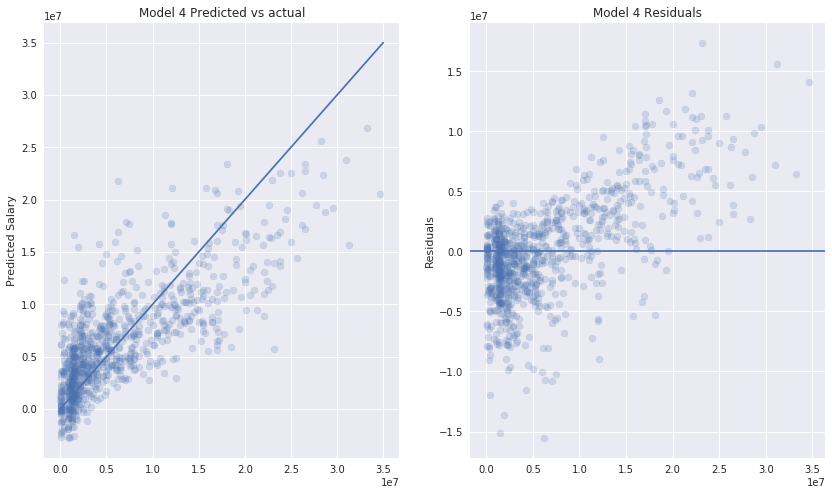

In [57]:
cubes = regress(add_cubic_cols(X, ['P_BPM', 'P_VORP']), y)
plots(y, cubes, 4)
print('Model 2 RMSE=', RMSE(y, cubes))
print('Model 2 MAD=', MAD(y, cubes))
#no real gains

In [58]:
#add cubic 
def add_square_cols(df, listcols):
    df2 = df.copy()
    for col in listcols:
        df2['square_%s' % col] = df2[col]**2
    return df2

[0.62770162 0.65186482 0.55645135 0.61050459 0.49704073]
Linear Reg Mean Score:  0.5887126201334305
Model 2 RMSE= 4048658.1165454364
Model 2 MAD= 3054987.5458374005


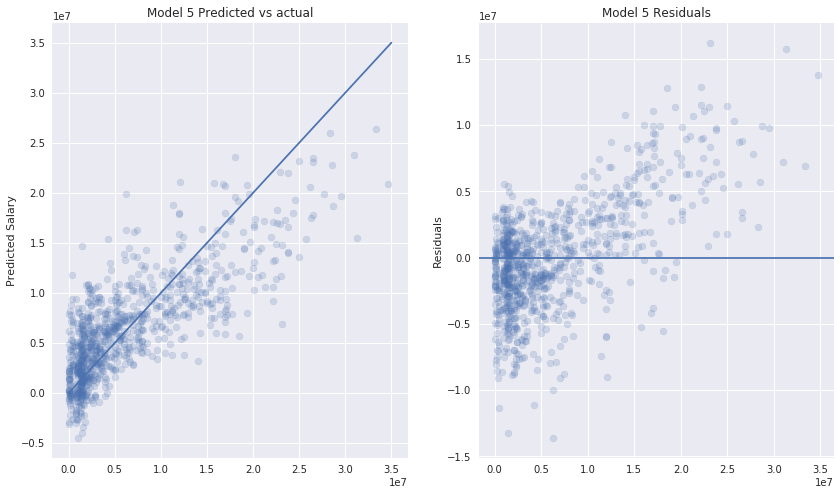

In [69]:
X_cubed = add_cubic_cols(X, ['P_BPM', 'P_VORP'])
sq = regress(add_square_cols(X_cubed, ['C_Age']), y)
plots(y, sq, 5)
print('Model 2 RMSE=', RMSE(y, sq))
print('Model 2 MAD=', MAD(y, sq))
squares = add_square_cols(X_cubed, ['C_Age']) 

In [61]:
#log target
ylog = np.log10(y)

In [65]:
def clean_for_log(x):
    if x > 0:
        return np.log10(x)
    else:
        return 0

def add_log_cols(df, listcols):
    df2 = df.copy()
    for col in listcols:
        df2['log_%s' % col] = df2[col].transform(clean_for_log)
    return df2  

In [66]:
regress(add_log_cols(X, ['P_PTS', 'P_AST', 'P_TRB']), ylog)

[0.48362891 0.52658072 0.45428914 0.55572166 0.3502695 ]
Linear Reg Mean Score:  0.4740979875164914


array([6.78999572, 6.9124035 , 5.74725683, 5.37113454, 6.63259869,
       6.25037428, 7.05835754, 6.48058487, 7.27339952, 6.44383599,
       6.5757651 , 5.92415283, 5.91238817, 6.61613678, 6.18060669,
       6.13895843, 6.96119358, 7.13812724, 6.56796051, 6.8997417 ,
       6.35969367, 5.89635446, 6.46318983, 6.54868734, 6.41183387,
       6.52750135, 6.28528259, 6.00928469, 7.15006503, 6.65615618,
       6.02317795, 6.85343805, 6.42043164, 6.554011  , 6.8517115 ,
       5.94408059, 6.02629103, 6.67904566, 6.4541442 , 6.78663333,
       6.43239607, 5.95736392, 6.9788139 , 5.79633208, 6.58732256,
       6.37218334, 6.76720748, 6.42562174, 6.00735791, 6.10553725,
       6.89132154, 6.71442831, 5.91883606, 6.17992547, 6.76820159,
       5.98741977, 5.86823182, 5.89350635, 6.90793702, 7.12147587,
       6.31630626, 6.60250102, 7.08010357, 6.39908763, 7.44157925,
       6.73193618, 7.05849305, 6.22824517, 5.99711964, 6.91137072,
       6.29313108, 6.48011846, 5.6831956 , 6.9295059 , 7.02253

In [70]:
logs = add_log_cols(squares, ['P_PTS', 'P_AST', 'P_TRB'])

In [71]:
log_lr = regress(logs, ylog)

[0.5014097  0.54624812 0.45624353 0.56633794 0.41198562]
Linear Reg Mean Score:  0.49644498269710685


#### R^2 = 0.55 to start

In [103]:
list(zip(X.columns, lm.coef_))

[('Draft Position', -14952.405405517045),
 ('C_Age', 186001.07988378714),
 ('Current Season(C)', 1139438.9380991114),
 ('C_Experience', 113695.78048001029),
 ('C_MP', 313.178141180033),
 ('C_TRB', 502168.7205618302),
 ('C_PTS', 59397.05565645277),
 ('C_AST', 191032.778115372),
 ('C_PER', -29471.580013279134),
 ('P_PTS', 527288.2724813742),
 ('P_MP', 153.36502877264866)]

Text(0.5,1,'Model 1 Predicted vs actual')

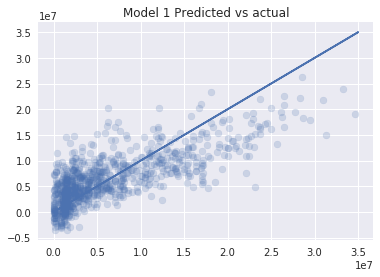

In [104]:
y_pred = lm.predict(X)

plt.scatter(y, y_pred, alpha=0.2)
plt.plot([0, 35000000, 1000], [0, 35000000, 1000])
plt.title('Model 1 Predicted vs actual')

Text(0.5,1,'Model 1 Residuals')

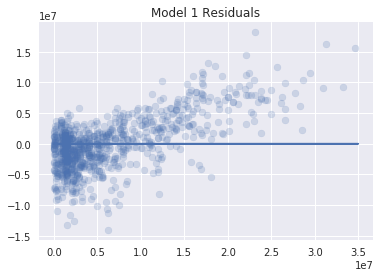

In [105]:
plt.scatter(y, y-y_pred, alpha=0.2)
plt.plot([0, 35000000, 1000], [0, 0, 1000])
plt.title('Model 1 Residuals')

In [106]:
def RMSE(actual, predicted):
    return np.sqrt(np.mean((actual - predicted)**2))

def MAD(actual, predicted):
    return np.mean(abs(actual - predicted))

print('Model 1 RMSE=', RMSE(y, y_pred))
print('Model 1 MAD=', MAD(y, y_pred))

Model 1 RMSE= 4307948.865062231
Model 1 MAD= 3263909.460328354


Expect to be off by \$3 million from basic linear regression model. Not great considering mean and standard deviation are around $6m and median is around \$3.7m

## LR Model 2: Set target as log_C_Salary. 
Since salary is so skewed. 

In [107]:
def clean_for_log(x):
    if x > 0:
        return np.log10(x)
    else:
        return 0

In [108]:
reduced2 = reduced.copy()
reduced2['log_C_Salary'] = reduced2['C_Salary'].transform(clean_for_log)
reduced2.head()

,Draft Position,C_Age,Current Season(C),C_Experience,C_MP,C_TRB,C_PTS,C_AST,C_PER,C_Salary,P_PTS,P_MP,log_C_Salary
0,5,36,2017,17,151,1.9,1.4,1.1,7.6,3500000,1.3,373.0,6.544068
1,5,35,2016,16,373,1.1,1.3,0.9,6.5,1499187,2.1,701.0,6.175856
3,61,23,2018,2,1520,2.4,8.6,3.2,15.9,1312611,2.9,294.0,6.118136
5,5,41,2018,20,1026,2.6,5.4,1.2,10.8,8000000,8.0,1799.0,6.903090
6,5,40,2017,19,1799,3.1,8.0,1.8,11.7,4264057,6.6,1005.0,6.629823


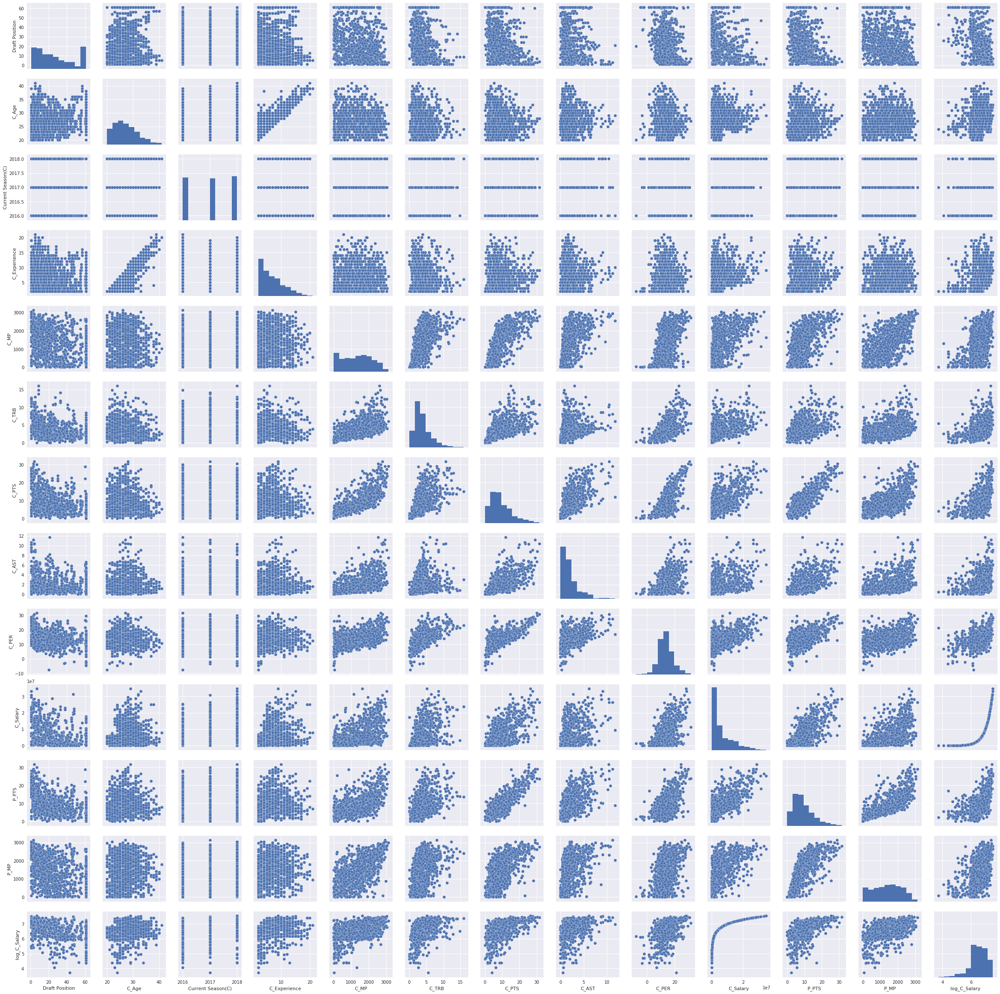

In [109]:
sns.pairplot(reduced2)

In [85]:
X.corr()

,Draft Position,C_Age,Current Season(C),C_Experience,C_MP,C_TRB,C_PTS,C_AST,C_VORP,P_PTS,P_MP,log_C_MP,log_C_PTS
Draft Position,1.000000,0.086296,0.020715,-0.209947,-0.293054,-0.341234,-0.372313,-0.198055,-0.230569,-0.387973,-0.349768,-0.272881,-0.360911
C_Age,0.086296,1.000000,-0.049021,0.884156,-0.073646,-0.112723,-0.106029,0.003170,-0.017107,0.052628,0.103669,-0.027948,-0.089147
Current Season(C),0.020715,-0.049021,1.000000,-0.039418,-0.026899,0.009491,0.013359,0.016754,-0.001382,0.012923,-0.014466,-0.026769,0.005168
C_Experience,-0.209947,0.884156,-0.039418,1.000000,0.079786,0.035701,0.078309,0.118952,0.088535,0.230716,0.248773,0.102858,0.089279
C_MP,-0.293054,-0.073646,-0.026899,0.079786,1.000000,0.547087,0.777182,0.539524,0.622266,0.617955,0.661133,0.868987,0.804442
C_TRB,-0.341234,-0.112723,0.009491,0.035701,0.547087,1.000000,0.542002,0.207219,0.557112,0.450550,0.434588,0.494275,0.557233
C_PTS,-0.372313,-0.106029,0.013359,0.078309,0.777182,0.542002,1.000000,0.662124,0.715311,0.856158,0.657367,0.634732,0.899569
C_AST,-0.198055,0.003170,0.016754,0.118952,0.539524,0.207219,0.662124,1.000000,0.582526,0.595983,0.490512,0.423940,0.586410
C_VORP,-0.230569,-0.017107,-0.001382,0.088535,0.622266,0.557112,0.715311,0.582526,1.000000,0.610867,0.468205,0.426990,0.552507
P_PTS,-0.387973,0.052628,0.012923,0.230716,0.617955,0.450550,0.856158,0.595983,0.610867,1.000000,0.753949,0.501173,0.743381


In [110]:
#X['log_C_MP'] = X['C_MP'].transform(clean_for_log)
#X['log_C_PTS'] = X['C_PTS'].transform(clean_for_log)
ylog = y.transform(clean_for_log)

In [111]:
model2 = sm.OLS(ylog,sm.add_constant(X)) #add_costant() adds the b of an mx+b
results2 = model2.fit()

results2.summary()
# worse than base line

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               C_Salary   R-squared:                       0.501
Model:                            OLS   Adj. R-squared:                  0.495
Method:                 Least Squares   F-statistic:                     82.42
Date:                Thu, 19 Jul 2018   Prob (F-statistic):          3.86e-128
Time:                        13:01:42   Log-Likelihood:                -510.77
No. Observations:                 915   AIC:                             1046.
Df Residuals:                     903   BIC:                             1103.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const              -206.6231     34.798     -5.938      0.000    -274.918    -138.329
Draft Position       -0.0048      0.001     -5.066      0.000      -0.007      -0.003
C_Age                 0.0168      0.009      1.828      0.068      -0.001       0.035
Current Season(C)     0.1051      0.017      6.092      0.000       0.071       0.139
C_Experience          0.0094      0.010      0.981      0.327      -0.009       0.028
C_MP                  0.0002   3.25e-05      6.812      0.000       0.000       0.000
C_TRB                 0.0068      0.008      0.805      0.421      -0.010       0.023
C_PTS                -0.0153      0.007     -2.135      0.033      -0.029      -0.001
C_AST                -0.0188      0.011     -1.732      0.084      -0.040       0.002
C_PER                 0.0157      0.005      3.493      0.001       0.007       0.025
P_PTS                 0.0227      0.006      3.799      0.000       0.011       0.034
P_MP                  0.0002   3.16e-05      5.118      0.000    9.96e-05       0.000
==============================================================================
Omnibus:                      204.713   Durbin-Watson:                   2.052
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              506.511
Skew:                          -1.173   Prob(JB):                    1.03e-110
Kurtosis:                       5.789   Cond. No.                     7.17e+06
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 7.17e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [26]:
X.head()

,Draft Position,C_Age,Current Season(C),C_Experience,C_MP,C_TRB,C_PTS,C_AST,C_VORP,P_PTS,P_MP,log_C_MP,log_C_PTS
236,28,34,2017,16,1587,1.8,10.1,4.5,-0.4,11.9,1980.0,7.369601,2.312535
274,1,26,2016,6,1170,8.4,21.4,4.9,1.6,21.9,2356.0,7.064759,3.063391
79,30,20,2017,2,447,2.3,2.5,0.5,0.3,1.8,21.0,6.102559,0.916291
266,47,24,2016,2,66,0.6,1.5,0.7,0.0,2.5,65.0,4.189655,0.405465
284,13,28,2018,8,1471,7.4,5.3,0.5,0.7,4.3,789.0,7.293698,1.667707


[0.48854985 0.53163908 0.43777626 0.55518149 0.39114748]
Linear Reg Mean Score:  0.4808588322597892


Text(0.5,1,'Model 2 Predicted vs actual')

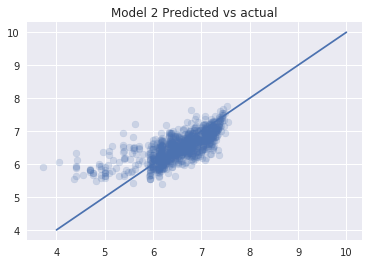

In [114]:
lr_log = LinearRegression()

log_scores = cross_val_score(lr_log, X, ylog, # estimator, features, target
                cv=kfold, # number of folds 
                scoring='r2') # scoring metric

print(log_scores)
print("Linear Reg Mean Score: ", np.mean(log_scores))


# Build the Model
lr_log.fit(X, ylog)

ylog_pred = lr_log.predict(X)

plt.scatter(ylog, ylog_pred, alpha=0.2)
plt.plot([4, 10], [4, 10])
plt.title('Model 2 Predicted vs actual')

In [117]:
def plot_log_residuals(actual, predicted, modelnumber):
    plt.scatter(actual, actual - predicted, alpha=0.2)
    plt.plot([3, 8], [0, 0])
    plt.title('Model %s Residuals' % modelnumber)

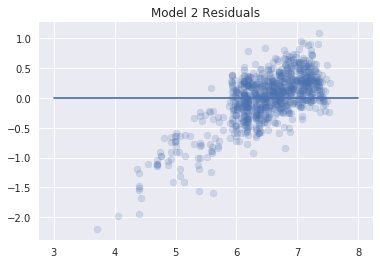

In [118]:
plot_log_residuals(ylog, ylog_pred, 2)

In [133]:
def quick_errors(actual, pred):
    print('RMSE=', np.sqrt(np.mean((actual - pred)**2)))
    print('MAD=', np.mean(abs(actual - pred)))

In [134]:
quick_errors(ylog, ylog_pred)

RMSE= 0.4228590165875964
MAD= 0.31061286255636567


Clear bias from a non linear relationship -> try polynomials.

## Model 3: Try polynomials

In [131]:


def quick_score(model, X, y):
    scores = cross_val_score(model, X, y, # estimator, features, target
                cv=kfold, # number of folds 
                scoring='r2') # scoring metric
    print(scores)
    print("Linear Reg Mean Score: ", np.mean(scores))



In [139]:
from sklearn.metrics import mean_squared_error
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures

interactions = PolynomialFeatures(degree=2, interaction_only=True)#only cross terms, not square terms
poly_lr = LinearRegression()
quick_score(poly_lr, interactions.fit_transform(X), ylog)

[0.24012542 0.3860037  0.42249864 0.38260134 0.13084441]
Linear Reg Mean Score:  0.31241470145259703


In [142]:
X_test.columns

Index(['Draft Position', 'C_Age', 'Current Season(C)', 'C_Experience', 'C_MP',
       'C_TRB', 'C_PTS', 'C_AST', 'C_PER', 'P_PTS', 'P_MP'],
      dtype='object')

In [185]:
def add_log_cols(df, listcols):
    df2 = df.copy()
    for col in listcols:
        df2['log_%s' % col] = df2[col].transform(clean_for_log)
    return df2    

In [162]:
add_log_cols(X, ['C_Age','C_MP', 'C_PTS', 'C_Experience','C_AST', 'P_PTS', 'P_MP', 'C_PER'])

/home/douglas/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [163]:
log_lr = LinearRegression()
quick_score(log_lr, X, ylog)

[0.51305141 0.57031084 0.45959374 0.58714616 0.42432011]
Linear Reg Mean Score:  0.5108844527978628


In [164]:
X.columns

Index(['Draft Position', 'C_Age', 'Current Season(C)', 'C_Experience', 'C_MP',
       'C_TRB', 'C_PTS', 'C_AST', 'C_PER', 'P_PTS', 'P_MP', 'log_C_MP',
       'log_C_PTS', 'log_C_Experience', 'log_C_AST', 'log_P_PTS', 'log_P_MP',
       'log_C_Age', 'log_C_TRB', 'square_C_PER', 'log_C_PER'],
      dtype='object')

In [165]:
def add_square_cols(df, listcols):
    df2 = df.copy()
    for col in listcols:
        df2['square_%s' % col] = df2[col]**2
    return df2

In [177]:
X2 = add_square_cols(X, ['log_C_MP',
       'log_C_PTS', 'log_P_PTS', 'log_P_MP', 'log_C_PER', 'Current Season(C)'])

In [178]:
X2.head()

,Draft Position,C_Age,Current Season(C),C_Experience,C_MP,C_TRB,C_PTS,C_AST,C_PER,P_PTS,...,log_C_Age,log_C_TRB,square_C_PER,log_C_PER,square_log_C_MP,square_log_C_PTS,square_log_P_PTS,square_log_P_MP,square_log_C_PER,square_Current Season(C)
236,28,34,2017,16,1587,1.8,10.1,4.5,13.0,11.9,...,1.531479,0.255273,169.00,1.113943,10.243693,1.008661,1.156801,10.868001,1.240870,4068289
274,1,26,2016,6,1170,8.4,21.4,4.9,22.1,21.9,...,1.414973,0.924279,488.41,1.344392,9.413764,1.770001,1.796790,11.371566,1.807391,4064256
79,30,20,2017,2,447,2.3,2.5,0.5,13.6,1.8,...,1.301030,0.361728,184.96,1.133539,7.024130,0.158356,0.065164,1.748264,1.284910,4068289
266,47,24,2016,2,66,0.6,1.5,0.7,10.5,2.5,...,1.380211,-0.221849,110.25,1.021189,3.310740,0.031008,0.158356,3.286655,1.042828,4064256
284,13,28,2018,8,1471,7.4,5.3,0.5,15.5,4.3,...,1.447158,0.869232,240.25,1.190332,10.033770,0.524576,0.401282,8.393055,1.416890,4072324


In [179]:
square_lr = LinearRegression()
quick_score(square_lr, X2, ylog)

[0.51344401 0.53633721 0.45885088 0.57550355 0.43165438]
Linear Reg Mean Score:  0.5031580035158811


Text(0.5,1,'Model 2 Predicted vs actual')

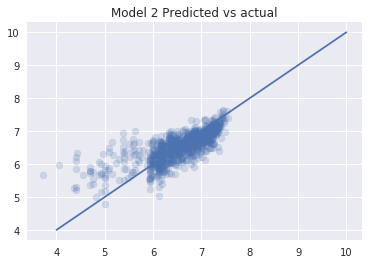

In [180]:
square_lr.fit(X2, ylog)
ysquare_pred = square_lr.predict(X2)

plt.scatter(ylog, ysquare_pred, alpha=0.2)
plt.plot([4, 10], [4, 10])
plt.title('Model 2 Predicted vs actual')

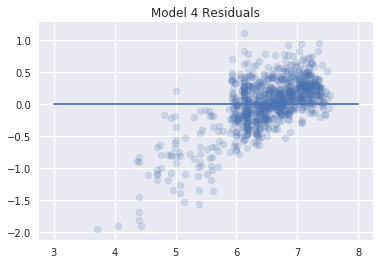

In [181]:
plot_log_residuals(ylog, ysquare_pred, 4)

# Model 5 retry

In [183]:
#Try again:
#hold out 10%
X_all = reduced.drop(['C_Salary'], axis=1)
y_all = reduced['C_Salary']
Xtry, X_test, ytry, y_test = train_test_split(X_all, y_all, test_size=0.1, random_state=42)

In [184]:
Xtry.columns

Index(['Draft Position', 'C_Age', 'Current Season(C)', 'C_Experience', 'C_MP',
       'C_TRB', 'C_PTS', 'C_AST', 'C_PER', 'P_PTS', 'P_MP'],
      dtype='object')

In [187]:
#confirm same
model5 = sm.OLS(ytry,sm.add_constant(Xtry)) #add_costant() adds the b of an mx+b
results = model.fit()

results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               C_Salary   R-squared:                       0.564
Model:                            OLS   Adj. R-squared:                  0.559
Method:                 Least Squares   F-statistic:                     106.4
Date:                Thu, 19 Jul 2018   Prob (F-statistic):          1.37e-154
Time:                        14:36:46   Log-Likelihood:                -15276.
No. Observations:                 915   AIC:                         3.058e+04
Df Residuals:                     903   BIC:                         3.063e+04
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const             -2.305e+09   3.55e+08     -6.503      0.000      -3e+09   -1.61e+09
Draft Position    -1.495e+04   9557.415     -1.564      0.118   -3.37e+04    3804.926
C_Age               1.86e+05   9.39e+04      1.981      0.048    1747.914     3.7e+05
Current Season(C)  1.139e+06   1.76e+05      6.485      0.000    7.95e+05    1.48e+06
C_Experience       1.137e+05   9.82e+04      1.158      0.247   -7.89e+04    3.06e+05
C_MP                313.1781    331.336      0.945      0.345    -337.100     963.456
C_TRB              5.022e+05   8.62e+04      5.828      0.000    3.33e+05    6.71e+05
C_PTS               5.94e+04   7.29e+04      0.815      0.415   -8.37e+04    2.02e+05
C_AST               1.91e+05    1.1e+05      1.729      0.084   -2.58e+04    4.08e+05
C_PER             -2.947e+04   4.59e+04     -0.642      0.521    -1.2e+05    6.06e+04
P_PTS              5.273e+05   6.09e+04      8.662      0.000    4.08e+05    6.47e+05
P_MP                153.3650    321.547      0.477      0.634    -477.702     784.432
==============================================================================
Omnibus:                       38.170   Durbin-Watson:                   2.108
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               55.353
Skew:                           0.373   Prob(JB):                     9.56e-13
Kurtosis:                       3.947   Cond. No.                     7.17e+06
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 7.17e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [217]:
# 1/x draft position
X5a = add_square_cols(Xtry, ['C_MP', 'C_PER', 'C_Age', 'C_Experience'])

In [218]:
X5a_lr = LinearRegression()
quick_score(X5a_lr, X5a, ytry)

[0.61826721 0.63854746 0.55233191 0.59946224 0.47399497]
Linear Reg Mean Score:  0.5765207595754213


Text(0.5,1,'Model 5a Predicted vs actual')

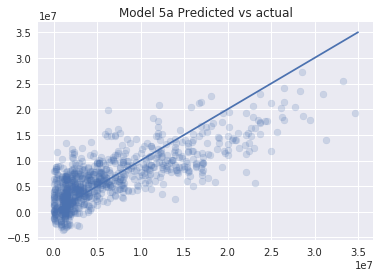

In [219]:
X5a_lr.fit(X5a, ytry)
y5a_pred = X5a_lr.predict(X5a)

plt.scatter(ytry, y5a_pred, alpha=0.2)
plt.plot([0, 35000000], [0, 35000000])
plt.title('Model 5a Predicted vs actual')



In [220]:
def plot_residuals(actual, pred, model):
    plt.scatter(actual, actual-pred, alpha=0.2)
    plt.plot([0, 35000000, 1000], [0, 0, 1000])
    plt.title('Model %s Residuals' % model)

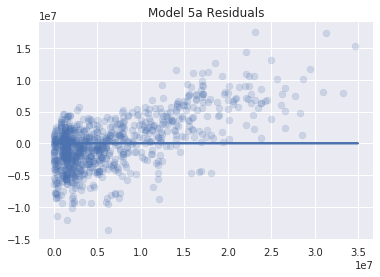

In [221]:
plot_residuals(ytry, y5a_pred, '5a')

In [224]:
X5b = add_log_cols(X5a, ['C_PTS', 'C_TRB', 'C_AST', 'P_PTS'])
X5b_lr = LinearRegression()
quick_score(X5b_lr, X5b, y)

[0.62721708 0.64678445 0.56877926 0.59713841 0.48848894]
Linear Reg Mean Score:  0.5856816257172085


In [225]:
#draft position 
X5c = X5b.copy()
X5c['inverse_draft'] = np.reciprocal(X5c['Draft Position'])

In [227]:
X5c_lr = LinearRegression()
quick_score(X5c_lr, X5c, y)

[0.62722775 0.64587869 0.56889114 0.59713466 0.48567308]
Linear Reg Mean Score:  0.5849610635497708


Text(0.5,1,'Model 5c Predicted vs actual')

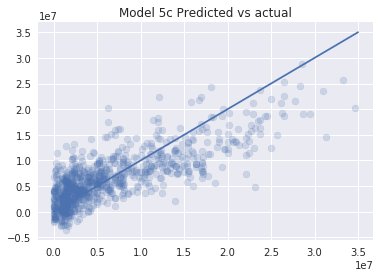

In [228]:
X5c_lr.fit(X5c, ytry)
y5c_pred = X5c_lr.predict(X5c)

plt.scatter(ytry, y5c_pred, alpha=0.2)
plt.plot([0, 35000000], [0, 35000000])
plt.title('Model 5c Predicted vs actual')



pandas.core.series.Series

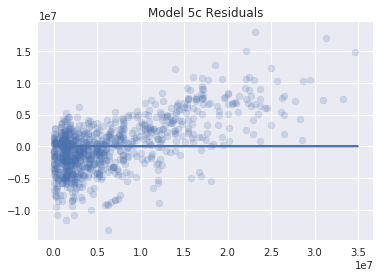

In [214]:
plot_residuals(ytry, y5c_pred, '5c')

In [230]:
quick_errors(ytry, y5c_pred)

RMSE= 4062969.904398252
MAD= 3058906.322625115


In [246]:
X5c.columns

Index(['Draft Position', 'C_Age', 'Current Season(C)', 'C_Experience', 'C_MP',
       'C_TRB', 'C_PTS', 'C_AST', 'C_PER', 'P_PTS', 'P_MP', 'square_C_MP',
       'square_C_PER', 'square_C_Age', 'square_C_Experience', 'log_C_PTS',
       'log_C_TRB', 'log_C_AST', 'log_P_PTS', 'inverse_draft'],
      dtype='object')

In [229]:
#confir
model5c = sm.OLS(ytry,sm.add_constant(X5c)) #add_costant() adds the b of an mx+b
results5c = model5c.fit()

results5c.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               C_Salary   R-squared:                       0.613
Model:                            OLS   Adj. R-squared:                  0.604
Method:                 Least Squares   F-statistic:                     70.69
Date:                Thu, 19 Jul 2018   Prob (F-statistic):          2.15e-168
Time:                        15:07:00   Log-Likelihood:                -15222.
No. Observations:                 915   AIC:                         3.049e+04
Df Residuals:                     894   BIC:                         3.059e+04
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const               -2.426e+09   3.37e+08     -7.190      0.000   -3.09e+09   -1.76e+09
Draft Position      -2.358e+04   9296.555     -2.537      0.011   -4.18e+04   -5335.978
C_Age                2.836e+06   5.44e+05      5.211      0.000    1.77e+06     3.9e+06
Current Season(C)    1.183e+06   1.67e+05      7.078      0.000    8.55e+05    1.51e+06
C_Experience         4.511e+05   2.04e+05      2.212      0.027    5.09e+04    8.51e+05
C_MP                   86.9712    828.944      0.105      0.916   -1539.932    1713.874
C_TRB                4.085e+05   1.56e+05      2.623      0.009    1.03e+05    7.14e+05
C_PTS                1.796e+05   1.07e+05      1.683      0.093   -2.99e+04    3.89e+05
C_AST                1.941e+05   1.84e+05      1.057      0.291   -1.66e+05    5.54e+05
C_PER                 4.03e+04   1.15e+05      0.350      0.726   -1.86e+05    2.66e+05
P_PTS                6.402e+05   8.93e+04      7.172      0.000    4.65e+05    8.15e+05
P_MP                  666.4421    328.239      2.030      0.043      22.234    1310.651
square_C_MP             0.2312      0.275      0.842      0.400      -0.308       0.770
square_C_PER        -1811.6274   4072.312     -0.445      0.657   -9804.033    6180.779
square_C_Age          -4.9e+04   9694.953     -5.055      0.000    -6.8e+04      -3e+04
square_C_Experience -9627.5470    1.1e+04     -0.877      0.381   -3.12e+04    1.19e+04
log_C_PTS             -3.7e+06   1.72e+06     -2.146      0.032   -7.08e+06   -3.16e+05
log_C_TRB            9.294e+05   1.37e+06      0.681      0.496   -1.75e+06    3.61e+06
log_C_AST           -4.492e+05   9.18e+05     -0.489      0.625   -2.25e+06    1.35e+06
log_P_PTS           -4.781e+06   1.34e+06     -3.568      0.000   -7.41e+06   -2.15e+06
inverse_draft        2.677e+05   8.05e+05      0.333      0.739   -1.31e+06    1.85e+06
==============================================================================
Omnibus:                       53.522   Durbin-Watson:                   2.148
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               86.355
Skew:                           0.449   Prob(JB):                     1.77e-19
Kurtosis:                       4.207   Cond. No.                     8.41e+09
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 8.41e+09. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [ ]:
Index(['Draft Position', 'C_Age', 'Current Season(C)', 'C_Experience', 'C_MP',
       'C_TRB', 'C_PTS', 'C_AST', 'C_PER', 'P_PTS', 'P_MP', 'square_C_MP',
       'square_C_PER', 'square_C_Age', 'square_C_Experience', 'log_C_PTS',
       'log_C_TRB', 'log_C_AST', 'log_P_PTS', 'inverse_draft']

In [250]:
X5d = X5c.copy()
from sklearn.preprocessing import StandardScaler
#Feature scaling for train, val, and test so that we can run our ridge model on each
scaler = StandardScaler()

scaled_age = scaler.fit_transform(X5d['C_Age'].reshape(-1,1))
#scaled_lr = LinearRegression()
#scaled_lr.fit(X_scaled, ylog)
#scaled_scores = cross_val_score(scaled_lr, X_scaled, ytry, # estimator, features, target
#                cv=kfold, # number of folds 
#                scoring='r2')
#print(scaled_scores)
#print("Linear Reg Mean Score: ", np.mean(scaled_scores))

/home/douglas/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:6: FutureWarning: reshape is deprecated and will raise in a subsequent release. Please use .values.reshape(...) instead
  
/home/douglas/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


In [251]:
X5d['Scaled_Age'] = scaled_age

In [253]:
X5d['Scaed_age**3'] = X5d['Scaled_Age']**3

In [255]:
X5d_lr = LinearRegression()
quick_score(X5d_lr, X5d,ytry)

[0.62695151 0.64727235 0.56389302 0.59949123 0.48578806]
Linear Reg Mean Score:  0.5846792351446396


In [281]:
X5e = X5c.copy()

In [282]:
X5e.columns

Index(['Draft Position', 'C_Age', 'Current Season(C)', 'C_Experience', 'C_MP',
       'C_TRB', 'C_PTS', 'C_AST', 'C_PER', 'P_PTS', 'P_MP', 'square_C_MP',
       'square_C_PER', 'square_C_Age', 'square_C_Experience', 'log_C_PTS',
       'log_C_TRB', 'log_C_AST', 'log_P_PTS', 'inverse_draft'],
      dtype='object')

In [270]:
X5e = X5e[['C_MP']]


In [279]:
cols = ['Draft Position', 'Current Season(C)', 'C_MP','C_PER', 'square_C_Age', 'log_C_PTS','log_P_PTS']

In [285]:
cols2 = ['Draft Position', 'C_Age', 'Current Season(C)', 'C_Experience', 'C_MP',
       'C_TRB', 'C_PTS', 'C_AST', 'C_PER', 'P_PTS', 'P_MP', 'square_C_MP',
       'square_C_PER', 'square_C_Age', 'square_C_Experience', 'log_C_PTS',
       'log_C_TRB', 'log_C_AST', 'log_P_PTS', 'inverse_draft']

In [296]:
cols2

['Draft Position',
 'C_Age',
 'Current Season(C)',
 'C_Experience',
 'C_MP',
 'C_TRB',
 'C_PTS',
 'C_AST',
 'C_PER',
 'P_PTS',
 'P_MP',
 'square_C_MP',
 'square_C_PER',
 'square_C_Age',
 'square_C_Experience',
 'log_C_PTS',
 'log_C_TRB',
 'log_C_AST',
 'log_P_PTS',
 'inverse_draft']

In [302]:
def try_drop_feature(df, feature, target):
    x = df.drop([feature], axis=1)
    print(x.columns)
    X5e_lr = LinearRegression()
    print(feature)
    scores = cross_val_score(X5e_lr, x, ytry, # estimator, features, target
                cv=kfold, # number of folds 
                scoring='r2')
    print(scores)
    print("Linear Reg Mean Score: ", np.mean(scores))

In [303]:
for col in cols2:
    try_drop_feature(X5e, col, ytry)

ValueError: labels ['Draft Position'] not contained in axis

In [267]:
X5e = X5e[['Draft Position', 'Current Season(C)', 'C_MP','C_PER', 'square_C_Age', 'log_C_PTS','log_P_PTS']]

KeyError: "['Draft Position' 'C_MP' 'C_PER' 'log_C_PTS'] not in index"

In [271]:
X5e_lr = LinearRegression()
quick_score(X5e_lr, X5e, ytry)

[0.24211237 0.33219528 0.18226782 0.29334507 0.19177724]
Linear Reg Mean Score:  0.24833955894024456


## Try to emulate 0.7 

In [231]:
reduced.head()

,Draft Position,C_Age,Current Season(C),C_Experience,C_MP,C_TRB,C_PTS,C_AST,C_PER,C_Salary,P_PTS,P_MP
0,5,36,2017,17,151,1.9,1.4,1.1,7.6,3500000,1.3,373.0
1,5,35,2016,16,373,1.1,1.3,0.9,6.5,1499187,2.1,701.0
3,61,23,2018,2,1520,2.4,8.6,3.2,15.9,1312611,2.9,294.0
5,5,41,2018,20,1026,2.6,5.4,1.2,10.8,8000000,8.0,1799.0
6,5,40,2017,19,1799,3.1,8.0,1.8,11.7,4264057,6.6,1005.0


In [232]:
reduced = C[['Draft Position', 'C_Age', 'Current Season(C)', 'C_Experience', 'C_MP', 'C_TRB', 'C_PTS', 'C_AST', 'C_PER', 'C_VORP', 'C_Salary']]

In [234]:
emu = add_square_cols(add_log_cols(reduced, ['C_Salary', 'C_PTS']), ['C_MP', 'C_PER'])

In [235]:
features = emu.drop(['C_Salary', 'log_C_Salary'], axis=1)
target = emu['log_C_Salary']

In [236]:
#hold out 10%
X_eval, X_holdout, y_eval, y_holdout = train_test_split(features, target, test_size=0.1, random_state=42)

In [237]:
#confirm same
model_emu = sm.OLS(y_eval,sm.add_constant(X_eval)) #add_costant() adds the b of an mx+b
results_emu = model_emu.fit()

results_emu.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           log_C_Salary   R-squared:                       0.511
Model:                            OLS   Adj. R-squared:                  0.505
Method:                 Least Squares   F-statistic:                     85.98
Date:                Thu, 19 Jul 2018   Prob (F-statistic):          7.52e-156
Time:                        15:29:39   Log-Likelihood:                -631.73
No. Observations:                1082   AIC:                             1291.
Df Residuals:                    1068   BIC:                             1361.
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const              -167.6623     32.891     -5.097      0.000    -232.201    -103.124
Draft Position       -0.0071      0.001     -8.029      0.000      -0.009      -0.005
C_Age                 0.0174      0.008      2.090      0.037       0.001       0.034
Current Season(C)     0.0858      0.016      5.263      0.000       0.054       0.118
C_Experience          0.0183      0.009      2.083      0.037       0.001       0.036
C_MP                  0.0006   7.85e-05      7.622      0.000       0.000       0.001
C_TRB                 0.0161      0.009      1.860      0.063      -0.001       0.033
C_PTS                 0.0463      0.008      5.462      0.000       0.030       0.063
C_AST                -0.0117      0.011     -1.056      0.291      -0.034       0.010
C_PER                 0.0376      0.011      3.562      0.000       0.017       0.058
C_VORP                0.0049      0.019      0.251      0.802      -0.033       0.043
log_C_PTS            -0.6229      0.142     -4.377      0.000      -0.902      -0.344
square_C_MP       -1.314e-07   2.77e-08     -4.748      0.000   -1.86e-07   -7.71e-08
square_C_PER         -0.0011      0.000     -2.684      0.007      -0.002      -0.000
==============================================================================
Omnibus:                      151.259   Durbin-Watson:                   1.970
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              313.328
Skew:                          -0.821   Prob(JB):                     9.16e-69
Kurtosis:                       5.063   Cond. No.                     8.01e+09
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 8.01e+09. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [243]:
reduce = C[['Draft Position', 'C_Age', 'C_MP', 'C_TRB', 'C_PTS', 'C_VORP', 'C_Salary']]
emu2 = add_square_cols(add_log_cols(reduce, ['C_Salary', 'C_PTS', 'C_MP']), ['C_MP'])
features = emu2.drop(['C_Salary', 'log_C_Salary'], axis=1)
target = emu2['log_C_Salary']

In [244]:
#hold out 10%
X_eval, X_holdout, y_eval, y_holdout = train_test_split(features, target, test_size=0.1, random_state=42)

In [245]:
#confirm same
model_emu2 = sm.OLS(y_eval,sm.add_constant(X_eval)) #add_costant() adds the b of an mx+b
results_emu2 = model_emu2.fit()

results_emu2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           log_C_Salary   R-squared:                       0.494
Model:                            OLS   Adj. R-squared:                  0.489
Method:                 Least Squares   F-statistic:                     116.1
Date:                Thu, 19 Jul 2018   Prob (F-statistic):          1.15e-151
Time:                        15:44:38   Log-Likelihood:                -651.12
No. Observations:                1082   AIC:                             1322.
Df Residuals:                    1072   BIC:                             1372.
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const              4.7778      0.196     24.330      0.000       4.392       5.163
Draft Position    -0.0080      0.001    -10.785      0.000      -0.009      -0.007
C_Age              0.0331      0.003     10.757      0.000       0.027       0.039
C_MP               0.0003      0.000      2.049      0.041     1.2e-05       0.001
C_TRB              0.0229      0.008      2.896      0.004       0.007       0.038
C_PTS              0.0422      0.008      5.555      0.000       0.027       0.057
C_VORP            -0.0066      0.016     -0.405      0.685      -0.039       0.025
log_C_PTS         -0.5025      0.133     -3.773      0.000      -0.764      -0.241
log_C_MP           0.2609      0.094      2.781      0.006       0.077       0.445
square_C_MP    -6.346e-08   3.81e-08     -1.664      0.096   -1.38e-07    1.14e-08
==============================================================================
Omnibus:                      158.269   Durbin-Watson:                   1.976
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              336.115
Skew:                          -0.845   Prob(JB):                     1.03e-73
Kurtosis:                       5.144   Cond. No.                     5.17e+07
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.17e+07. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [182]:
print(X.columns)
print(X_test.columns)
ytestlog = y_test.transform(clean_for_log)

Index(['Draft Position', 'C_Age', 'Current Season(C)', 'C_Experience', 'C_MP',
       'C_TRB', 'C_PTS', 'C_AST', 'C_PER', 'P_PTS', 'P_MP', 'log_C_MP',
       'log_C_PTS', 'log_C_Experience', 'log_C_AST', 'log_P_PTS', 'log_P_MP',
       'log_C_Age', 'log_C_TRB', 'square_C_PER', 'log_C_PER'],
      dtype='object')
Index(['Draft Position', 'C_Age', 'Current Season(C)', 'C_Experience', 'C_MP',
       'C_TRB', 'C_PTS', 'C_AST', 'C_PER', 'P_PTS', 'P_MP', 'log_C_MP',
       'log_C_PTS', 'log_C_Experience', 'log_C_AST', 'log_P_PTS', 'log_P_MP'],
      dtype='object')


In [147]:
#est = make_pipeline(PolynomialFeatures(degree), 
est = LinearRegression()
est.fit(X, ylog) 
print(len(y_test.transform(clean_for_log)))
print(len(est.predict(X_test)))


102
102


[1.89984356e+00 9.44037834e-01 1.20293922e+00 4.22503080e-01
 1.75677274e-03] [1.89984356e+00 9.44037834e-01 1.20293922e+00 4.22503080e-01
 1.75677274e-03]


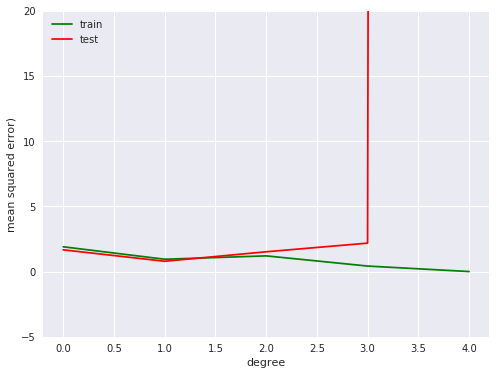

In [46]:
# Step through degrees from 0 to 9 and store the training and test (generalization) error.
train_error = np.empty(5)
test_error = np.empty(5)
rmsesame = np.empty(5)
for degree in range(5):
    est = make_pipeline(PolynomialFeatures(degree, interaction_only=True), LinearRegression())
    est.fit(X, ylog)
    train_error[degree] = mean_squared_error(ylog, est.predict(X))
    rmsesame[degree] = RMSE(ylog, est.predict(X))**2
    test_error[degree] = mean_squared_error(ytestlog, est.predict(X_test))
print(train_error, rmsesame)
# Plot the training and test errors against degree
plt.figure(figsize=(8,6))
plt.plot(np.arange(5), train_error, color='green', label='train')
plt.plot(np.arange(5), test_error, color='red', label='test');
plt.ylim((-5, 20))
plt.ylabel('mean squared error)')
plt.xlabel('degree')
plt.legend(loc='upper left')

In [121]:
lr_inter = make_pipeline(PolynomialFeatures(2, interaction_only=True), LinearRegression())
#lr_inter.fit(X, ylog)

In [122]:
inter_scores = cross_val_score(lr_inter, X, ylog, # estimator, features, target
                cv=kfold, # number of folds 
                scoring='r2')
print(inter_scores)
print("Linear Reg Mean Score: ", np.mean(inter_scores))

[0.24012542 0.3860037  0.42249864 0.38260134 0.13084441]
Linear Reg Mean Score:  0.31241470145259703


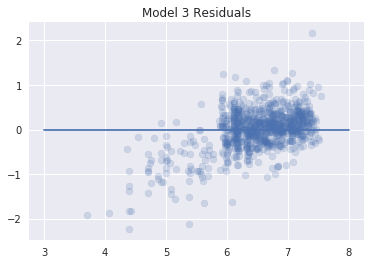

In [123]:
lr_inter.fit(X, ylog)
inter_pred = lr_inter.predict(X)
plot_log_residuals(ylog, inter_pred, 3)


# LR Model 4: Standardize

In [65]:
from sklearn.preprocessing import StandardScaler

Index(['Draft Position', 'C_Age', 'Current Season(C)', 'C_Experience', 'C_MP',
       'C_TRB', 'C_PTS', 'C_AST', 'C_VORP', 'P_PTS', 'P_MP', 'log_C_MP',
       'log_C_PTS'],
      dtype='object')

In [66]:
#Feature scaling for train, val, and test so that we can run our ridge model on each
scaler = StandardScaler()

X_scaled = scaler.fit_transform(X)


In [69]:
scaled_lr = LinearRegression()
#scaled_lr.fit(X_scaled, ylog)
scaled_scores = cross_val_score(scaled_lr, X_scaled, ylog, # estimator, features, target
                cv=kfold, # number of folds 
                scoring='r2')
print(scaled_scores)
print("Linear Reg Mean Score: ", np.mean(scaled_scores))

[0.50855479 0.51889915 0.42134821 0.56128221 0.38644483]
Linear Reg Mean Score:  0.47930583833201934


## LR Model 5: Add specific squares 

In [74]:
def add_square_col(X, cols):
    square_X = X.copy()
    for col in cols:
        square_X['%s**2' % col] = square_X[col]**2
    return square_X

In [79]:
add_square_col(X, ['log_C_MP'])
square_lr = LinearRegression()
#scaled_lr.fit(X_scaled, ylog)
square_scores = cross_val_score(square_lr,add_square_col(X, ['log_C_MP']), ylog, # estimator, features, target
                cv=kfold, # number of folds 
                scoring='r2')
print(square_scores)
print("Linear Reg Mean Score: ", np.mean(square_scores))

[0.50495865 0.51383557 0.41941146 0.56298545 0.38474439]
Linear Reg Mean Score:  0.4771871045573975


In [31]:
from sklearn.linear_model import Lasso, Ridge, ElasticNet, LinearRegression

from sklearn.model_selection import (cross_val_score, train_test_split, 
                                     KFold, GridSearchCV)

In [32]:
#hold out 10%
X_eval, X_holdout, y_eval, y_holdout = train_test_split(full_X, y, test_size=0.1, random_state=42)

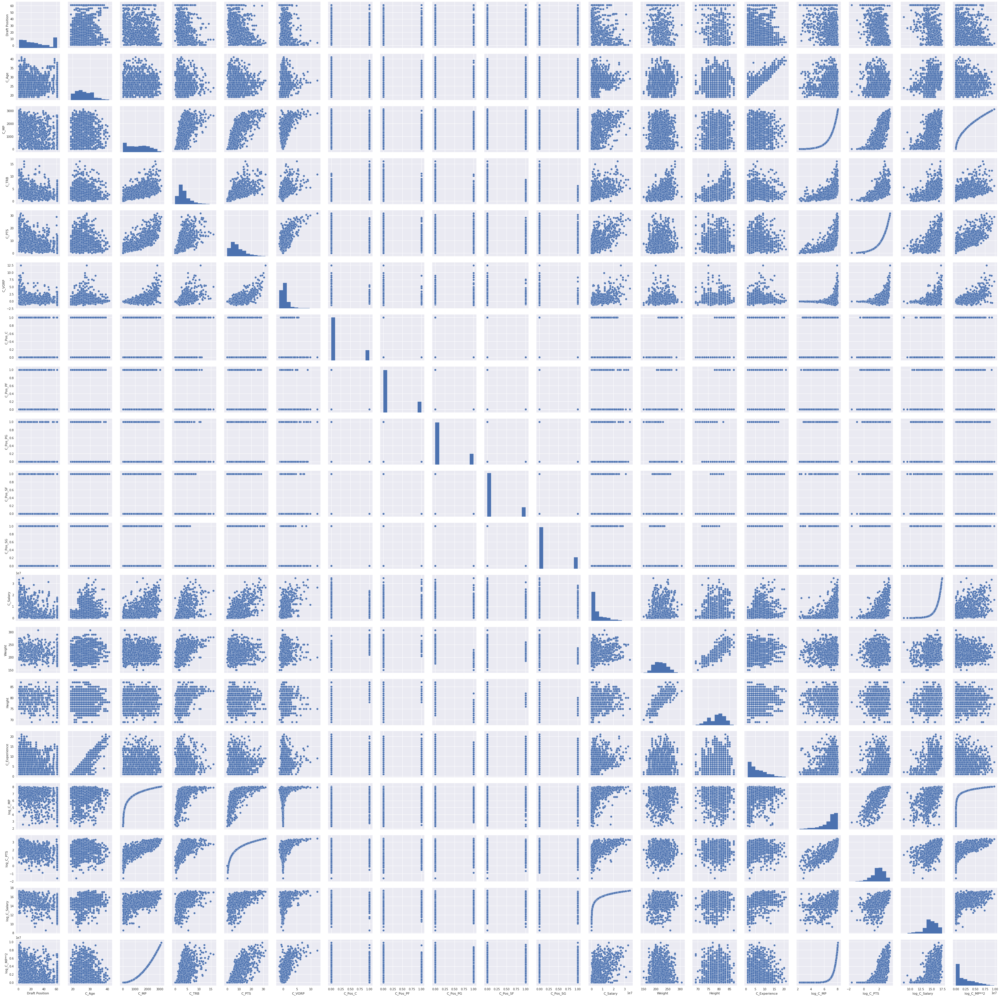

In [33]:
sns.pairplot(reduced)

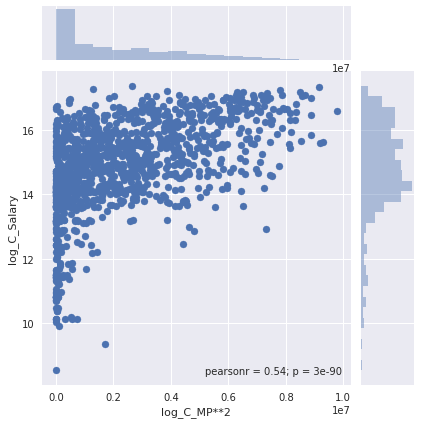

In [35]:
sns.jointplot(reduced['log_C_MP**2'], reduced['log_C_Salary'])

In [36]:
reduced.columns

Index(['Draft Position', 'C_Age', 'C_MP', 'C_TRB', 'C_PTS', 'C_VORP',
       'C_Pos_C', 'C_Pos_PF', 'C_Pos_PG', 'C_Pos_SF', 'C_Pos_SG', 'C_Salary',
       'Weight', 'Height', 'C_Experience', 'log_C_MP', 'log_C_PTS',
       'log_C_Salary', 'log_C_MP**2'],
      dtype='object')

In [37]:
reduced2 = reduced[['Draft Position', 'C_Age', 'C_MP', 'C_TRB', 'C_PTS', 'C_VORP', 'C_Salary', 'C_Experience', 'log_C_MP', 'log_C_PTS','log_C_Salary', 'log_C_MP**2']]

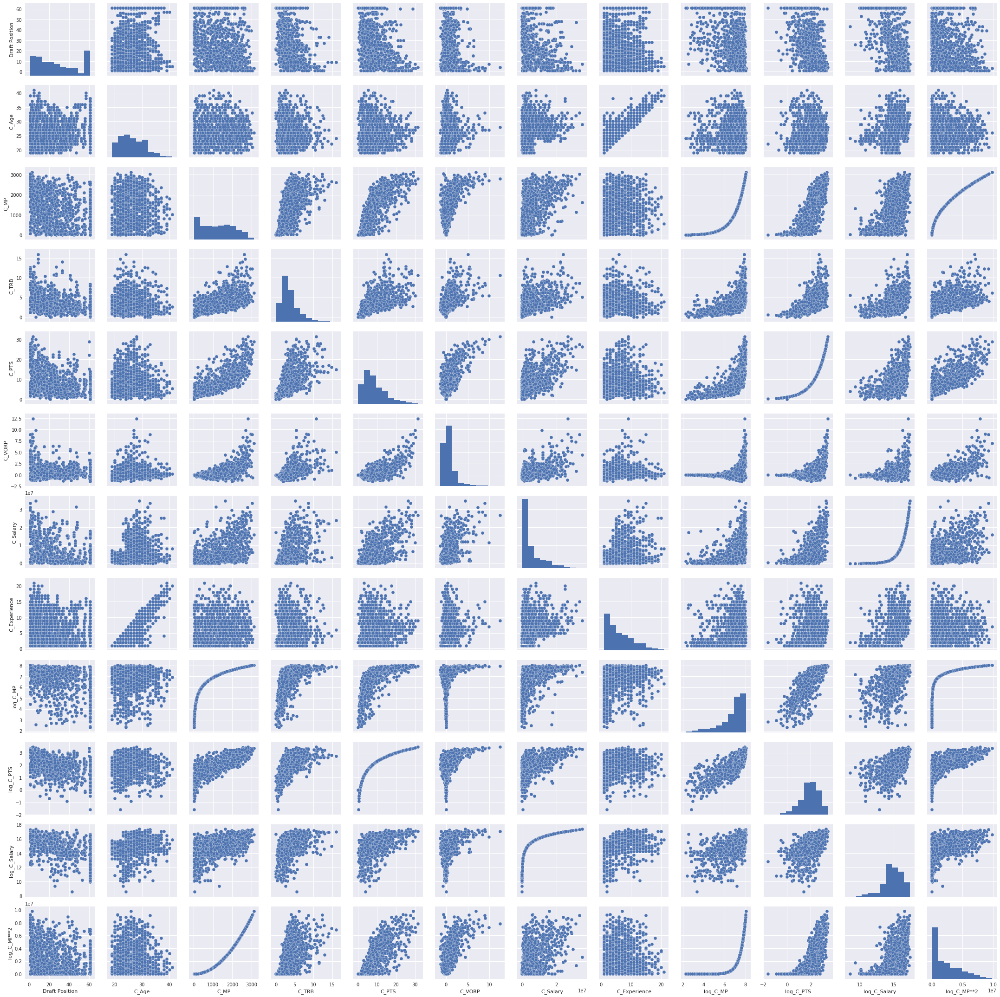

In [39]:
sns.pairplot(reduced2)

In [28]:
kfold = KFold(n_splits=5, shuffle=True, random_state=0)

In [40]:
full_X = reduced2.drop('log_C_Salary', axis=1)
y = reduced['log_C_Salary']

In [41]:
#hold out 10%
X_eval, X_holdout, y_eval, y_holdout = train_test_split(full_X, y, test_size=0.1, random_state=42)

In [43]:
lin_reg_est = LinearRegression()

scores = cross_val_score(lin_reg_est, X_eval, y_eval, cv=kfold)
print(scores)
print("Linear Reg Mean Score: ", np.mean(scores))

# Build the Model
lin_reg_est.fit(X_eval, y_eval)

[0.73069842 0.7077854  0.7232686  0.66219903 0.73080161]
Linear Reg Mean Score:  0.7109506117606019


LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [44]:
list(zip(X_eval.columns, lin_reg_est.coef_))

[('Draft Position', -0.012809017736383618),
 ('C_Age', 0.023781257105593406),
 ('C_MP', 0.0005972233166802725),
 ('C_TRB', -0.01081487793369082),
 ('C_PTS', -0.016510220605567505),
 ('C_VORP', -0.04181005886516358),
 ('C_Salary', 1.5405195728443455e-07),
 ('C_Experience', -0.0055338674586490385),
 ('log_C_MP', 0.2740430299918195),
 ('log_C_PTS', -0.1675245742306212),
 ('log_C_MP**2', -1.460533360694155e-07)]

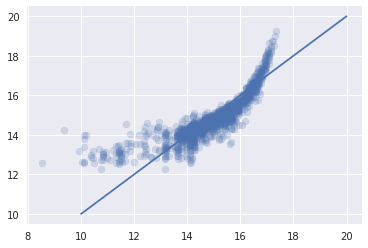

In [45]:
# Fitted vs. Actual
y_eval_pred = lin_reg_est.predict(X_eval)

plt.scatter(y_eval, y_eval_pred, alpha=0.2)
plt.plot([10,20], [10, 20])

Text(0.5,1,'Actual vs. Residuals')

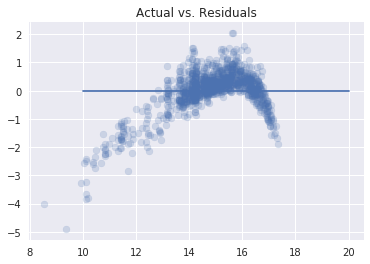

In [61]:
# Plot Residuals

lin_reg_residuals = y_eval - y_eval_pred

plt.scatter(y_eval, lin_reg_residuals, alpha=0.2)
plt.plot([10,20], [0, 0])
plt.title("Actual vs. Residuals")

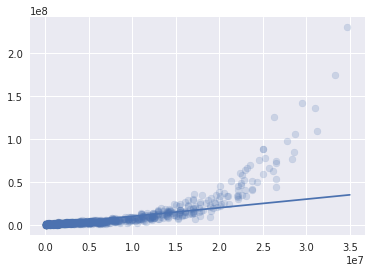

In [71]:
# Fitted vs. Actual on original scale
plt.scatter(np.e**y_eval, np.e**y_eval_pred, alpha=0.2)
plt.plot([0,35000000], [0,35000000])

Text(0.5,1,'Actual vs. Residuals')

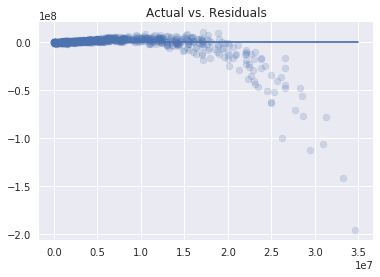

In [73]:
# Plot Residuals

lin_reg_residuals = np.e**y_eval - np.e**y_eval_pred

plt.scatter(np.e**y_eval, lin_reg_residuals, alpha=0.2)
plt.plot([0, 35000000], [0,0])
plt.title("Actual vs. Residuals")

# Add Age quadratic term

In [49]:
reduced2['C_Age**2'] = reduced2['C_Age']**2

/home/douglas/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [50]:
reduced2.head()

,Draft Position,C_Age,C_MP,C_TRB,C_PTS,C_VORP,C_Salary,C_Experience,log_C_MP,log_C_PTS,log_C_Salary,log_C_MP**2,C_Age**2
4,61,22,294,1.1,2.9,-0.1,543471,1,5.683580,1.064711,13.205732,86436,484
8,28,20,29,1.2,0.9,-0.1,1414920,1,3.367296,-0.105361,14.162584,841,400
26,12,21,1463,2.4,7.6,0.2,2759280,1,7.288244,2.028148,14.830480,2140369,441
29,14,21,698,1.5,5.0,0.1,2021520,1,6.548219,1.609438,14.519360,487204,441
33,35,20,516,4.4,5.6,0.1,950000,1,6.246107,1.722767,13.764217,266256,400


In [52]:
def try_new_variable(df): 
    full_X = df.drop('log_C_Salary', axis=1)
    y = df['log_C_Salary']
    #hold out 10%
    X_eval, X_holdout, y_eval, y_holdout = train_test_split(full_X, y, test_size=0.1, random_state=42)
    lin_reg_est = LinearRegression()

    scores = cross_val_score(lin_reg_est, X_eval, y_eval, cv=kfold)
    print(scores)
    print("Linear Reg Mean Score: ", np.mean(scores))

    # Build the Model
    lin_reg_est.fit(X_eval, y_eval)

In [53]:
try_new_variable(reduced2)

[0.73114077 0.70649782 0.72379627 0.662362   0.73041443]
Linear Reg Mean Score:  0.7108422582692556


In [ ]:
y_eval_pred = lin_reg_est.predict(X_eval)

plt.scatter(y_eval, y_eval_pred, alpha=0.2)
plt.plot([10,20], [10, 20])

In [55]:
reduced2['C_Age**3'] = reduced2['C_Age']**3

/home/douglas/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [56]:
try_new_variable(reduced2)

[0.73573907 0.71014216 0.72417677 0.66526674 0.73420115]
Linear Reg Mean Score:  0.7139051784776459


In [97]:
reduced2['C_Age**4'] = reduced2['C_Age']**4
try_new_variable(reduced2)


[0.736717   0.71158666 0.72408866 0.67044311 0.7361272 ]
Linear Reg Mean Score:  0.7157925258067712


/home/douglas/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [62]:
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor

rf = RandomForestRegressor(n_estimators=1800, max_features=3)
rf.fit(X_eval, y_eval)
rf.score(X_holdout, y_holdout)

0.9771932512091374

In [74]:
# Try interactions

In [77]:
lr_interact = LinearRegression()

scores_interact = cross_val_score(lr_interact, interactions.fit_transform(X_eval), y_eval, cv=kfold)
print(scores)
print("Linear Reg Mean Score: ", np.mean(scores))

# Build the Model
#lin_reg_est.fit(X_eval, y_eval)

[0.73069842 0.7077854  0.7232686  0.66219903 0.73080161]
Linear Reg Mean Score:  0.7109506117606019


In [80]:
(interactions.fit_transform(X_eval)).shape

(1082, 67)

In [88]:
from sklearn.metrics import r2_score, mean_squared_error

lr_interact2 = LinearRegression()
X_try, X_test, y_try, y_test = train_test_split(X_eval, y_eval, test_size=0.2, random_state=42)

poly = PolynomialFeatures(degree=2)

lm_poly = LinearRegression()
lm_poly.fit(poly.fit_transform(X_try), y_try)
y_pred = lm_poly.predict(poly.transform(X_test))
print("Polynomial Regression:", r2_score(y_test, y_pred))

#lr_interact2.fit(X_try, y_try)
#lr_interact2
#print('OLS regression with interaction terms val R^2: %.3f' % lr_interact2.score(interactions.transform(X_test), y_test))
#print('OLS regression with interaction terms val RMSE: %.3f' 
 #     % RMSE(lr_interact2.predict(interactions.fit_transform(X_test)), y_test))


Polynomial Regression: 0.7092777384356416


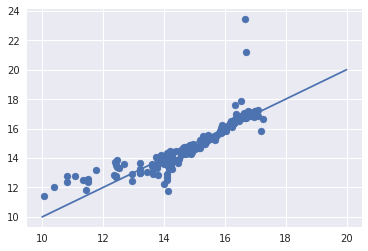

In [91]:
plt.scatter(y_test, y_pred)
plt.plot([10,20], [10,20])

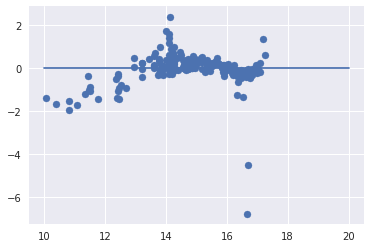

In [94]:
plt.scatter(y_test, y_test - y_pred)
plt.plot([10,20], [0,0])

In [98]:
# interactions
poly_inter = PolynomialFeatures(degree=2, interaction_only=True)

lm_poly_inter = LinearRegression()
lm_poly_inter.fit(poly_inter.fit_transform(X_try), y_try)
y_pred_inter = lm_poly.predict(poly.transform(X_test))
print("Polynomial Regression:", r2_score(y_test, y_pred_inter))

Polynomial Regression: 0.7092777384356416


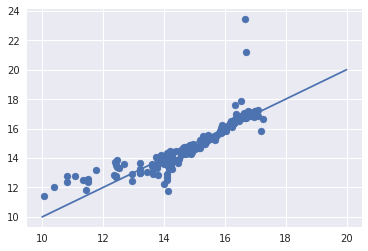

In [100]:
plt.scatter(y_test, y_pred_inter)
plt.plot([10,20], [10,20])

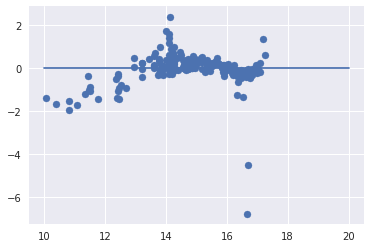

In [101]:
plt.scatter(y_test, y_test - y_pred_inter)
plt.plot([10,20], [0,0])

Lasso Model:


/home/douglas/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/douglas/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/douglas/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/douglas/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did no

[mean: 0.71097, std: 0.02576, params: {'alpha': 0.0001},
 mean: 0.71098, std: 0.02575, params: {'alpha': 0.0001604217161115324},
 mean: 0.71099, std: 0.02573, params: {'alpha': 0.000257351270001691},
 mean: 0.71100, std: 0.02569, params: {'alpha': 0.000412847323771536},
 mean: 0.71101, std: 0.02564, params: {'alpha': 0.0006622967617148325},
 mean: 0.71103, std: 0.02557, params: {'alpha': 0.001062467830894041},
 mean: 0.71106, std: 0.02545, params: {'alpha': 0.0017044291274531946},
 mean: 0.71107, std: 0.02526, params: {'alpha': 0.002734274456165233},
 mean: 0.71101, std: 0.02497, params: {'alpha': 0.004386370005779536},
 mean: 0.71091, std: 0.02456, params: {'alpha': 0.007036690038273056},
 mean: 0.71089, std: 0.02406, params: {'alpha': 0.011288378916846895},
 mean: 0.71009, std: 0.02295, params: {'alpha': 0.018109011179578204},
 mean: 0.70913, std: 0.02198, params: {'alpha': 0.029050786505108613},
 mean: 0.70902, std: 0.02206, params: {'alpha': 0.04660377025539271},
 mean: 0.70853, st

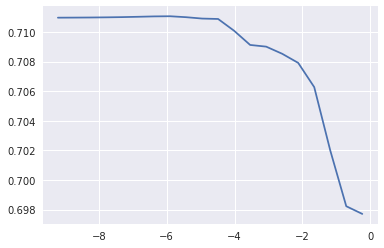

In [102]:
print("Lasso Model:")
params = {
    "alpha": np.logspace(-4, -.1, 20)
}

grid_est = GridSearchCV(Lasso(), param_grid=params, cv=kfold)
grid_est.fit(X_eval, y_eval)
df = pd.DataFrame(grid_est.grid_scores_)
df["alpha"] = df.parameters.apply(lambda val: val["alpha"])
plt.plot(np.log(df.alpha), df.mean_validation_score);
grid_est.grid_scores_

In [103]:
grid_est.best_estimator_

Lasso(alpha=0.002734274456165233, copy_X=True, fit_intercept=True,
   max_iter=1000, normalize=False, positive=False, precompute=False,
   random_state=None, selection='cyclic', tol=0.0001, warm_start=False)

In [122]:
def try_new_lasso(df): 
    full_X = df.drop('log_C_Salary', axis=1)
    y = df['log_C_Salary']
    #hold out 10%
    X_eval, X_holdout, y_eval, y_holdout = train_test_split(full_X, y, test_size=0.1, random_state=42)
    lasso = Lasso(alpha=.0027)

    scores = cross_val_score(lasso, X_eval, y_eval, cv=kfold)
    print(scores)
    print("Lasso lr Mean Score: ", np.mean(scores))

    # Build the Model
    lasso.fit(X_eval, y_eval)
    return lasso.predict(y_)

In [123]:
try_new_lasso(reduced2)

[0.7410816  0.72496998 0.73308654 0.67886868 0.75129935]
Lasso lr Mean Score:  0.7258612283387771


/home/douglas/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/douglas/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/douglas/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/douglas/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did no

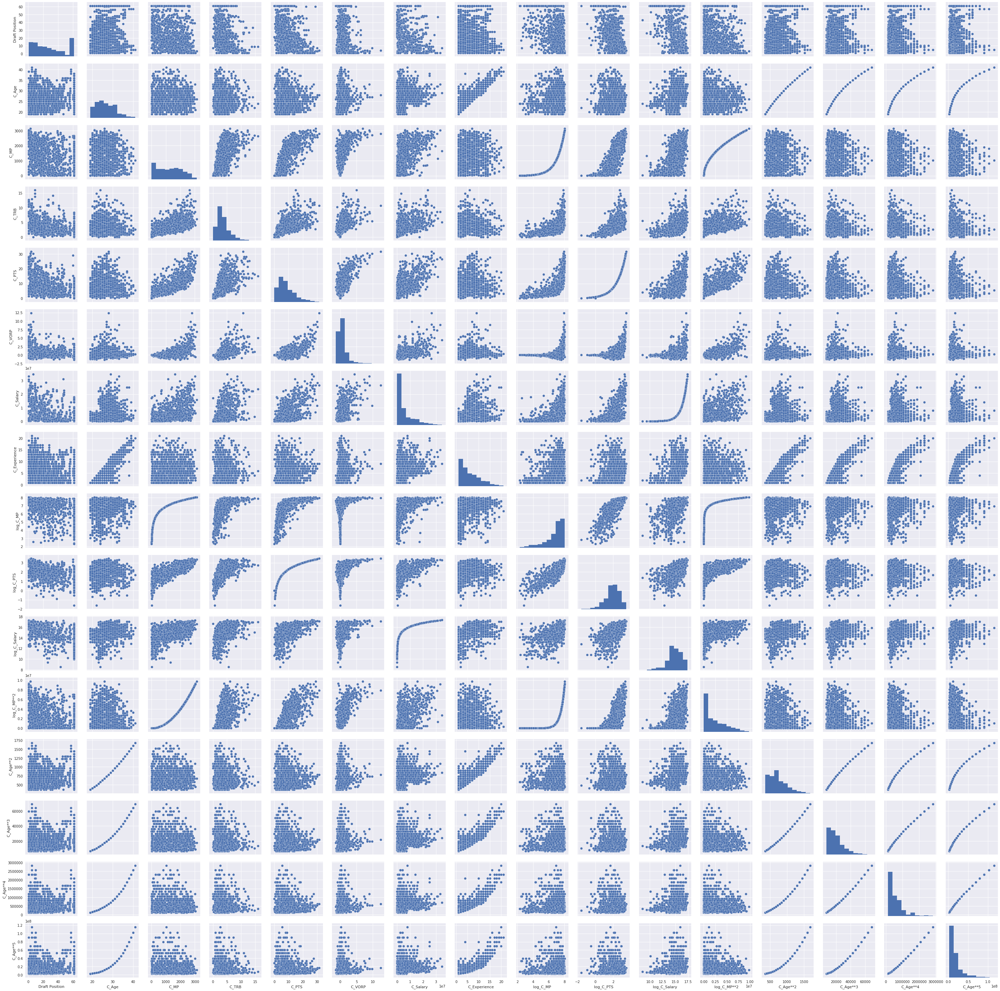

In [105]:
sns.pairplot(reduced2)

In [111]:
reduced2['log_C_Experience'] = np.log(reduced2['C_Experience'])

/home/douglas/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [112]:
try_new_variable(reduced2)

[0.74531264 0.7303121  0.73161622 0.68100952 0.76002686]
Linear Reg Mean Score:  0.7296554677856097


In [115]:

reduced2['log_C_TRB'] = reduced2['C_TRB'].transform(clean_for_log)

/home/douglas/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [120]:

reduced2['log_C_VORP'] = reduced2['C_VORP'].transform(clean_for_log)

/home/douglas/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [121]:
try_new_variable(reduced2)

[0.74610235 0.73171929 0.7350759  0.68274131 0.75709182]
Linear Reg Mean Score:  0.7305461338451893


In [119]:
reduced2.head()

,Draft Position,C_Age,C_MP,C_TRB,C_PTS,C_VORP,C_Salary,C_Experience,log_C_MP,log_C_PTS,log_C_Salary,log_C_MP**2,C_Age**2,C_Age**3,C_Age**4,C_Age**5,log_C_Experience,log_C_TRB
4,61,22,294,1.1,2.9,-0.1,543471,1,5.683580,1.064711,13.205732,86436,484,10648,234256,5153632,0.0,0.095310
8,28,20,29,1.2,0.9,-0.1,1414920,1,3.367296,-0.105361,14.162584,841,400,8000,160000,3200000,0.0,0.182322
26,12,21,1463,2.4,7.6,0.2,2759280,1,7.288244,2.028148,14.830480,2140369,441,9261,194481,4084101,0.0,0.875469
29,14,21,698,1.5,5.0,0.1,2021520,1,6.548219,1.609438,14.519360,487204,441,9261,194481,4084101,0.0,0.405465
33,35,20,516,4.4,5.6,0.1,950000,1,6.246107,1.722767,13.764217,266256,400,8000,160000,3200000,0.0,1.481605


In [117]:
try_new_variable(reduced2)

[0.7459917  0.73276539 0.73453882 0.681186   0.75619804]
Linear Reg Mean Score:  0.730135987406323


In [118]:
reduced2.corr()

,Draft Position,C_Age,C_MP,C_TRB,C_PTS,C_VORP,C_Salary,C_Experience,log_C_MP,log_C_PTS,log_C_Salary,log_C_MP**2,C_Age**2,C_Age**3,C_Age**4,C_Age**5,log_C_Experience,log_C_TRB
Draft Position,1.000000,0.043917,-0.351176,-0.364175,-0.394168,-0.230399,-0.354524,-0.254698,-0.337858,-0.386528,-0.462977,-0.323259,0.026038,0.009546,-0.005061,-0.017497,-0.266141,-0.386028
C_Age,0.043917,1.000000,0.019044,-0.027974,-0.014795,0.060763,0.243344,0.889020,0.053512,0.004675,0.240355,-0.004648,0.995179,0.980934,0.958152,0.928338,0.822346,-0.011992
C_MP,-0.351176,0.019044,1.000000,0.575114,0.784078,0.600946,0.527285,0.170037,0.871673,0.808624,0.581815,0.960423,0.006537,-0.006076,-0.018090,-0.028914,0.258933,0.634798
C_TRB,-0.364175,-0.027974,0.575114,1.000000,0.584828,0.571037,0.487132,0.114674,0.515833,0.595196,0.446379,0.549934,-0.036243,-0.043963,-0.050800,-0.056520,0.181612,0.901047
C_PTS,-0.394168,-0.014795,0.784078,0.584828,1.000000,0.698934,0.641828,0.156141,0.642956,0.900618,0.548066,0.799560,-0.029970,-0.044411,-0.057408,-0.068441,0.246995,0.605075
C_VORP,-0.230399,0.060763,0.600946,0.571037,0.698934,1.000000,0.548436,0.156079,0.411287,0.535324,0.412360,0.673883,0.043572,0.026986,0.011757,-0.001548,0.226359,0.504684
C_Salary,-0.354524,0.243344,0.527285,0.487132,0.641828,0.548436,1.000000,0.381851,0.413040,0.544283,0.782233,0.547483,0.220995,0.196221,0.170358,0.144710,0.450180,0.465325
C_Experience,-0.254698,0.889020,0.170037,0.114674,0.156141,0.156079,0.381851,1.000000,0.181449,0.165796,0.392228,0.141784,0.895645,0.892671,0.880572,0.860530,0.924897,0.137243
log_C_MP,-0.337858,0.053512,0.871673,0.515833,0.642956,0.411287,0.413040,0.181449,1.000000,0.791641,0.561807,0.730432,0.043625,0.033308,0.023200,0.013864,0.262040,0.650016
log_C_PTS,-0.386528,0.004675,0.808624,0.595196,0.900618,0.535324,0.544283,0.165796,0.791641,1.000000,0.539983,0.746889,-0.010867,-0.026021,-0.039995,-0.052166,0.258977,0.700046


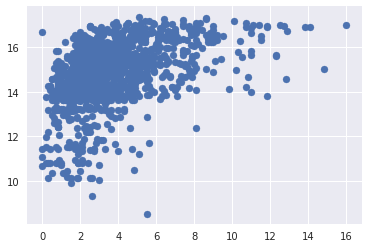

In [109]:
plt.scatter(reduced2['C_TRB'], reduced2['log_C_Salary'])